In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#pip install pandas_ta

In [3]:
import pandas_ta as ta

In [4]:
import random
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [5]:
# Everything concerning USDTRY pair is done here, after testing the models CHECK THIS PART!
bist_daily = pd.read_csv("datasets/bist_100_daily.csv")
usdtry_daily = pd.read_csv('datasets/USDTRY_daily.csv')
usdtry_daily = usdtry_daily[["Date","USDTRY_Close"]]
usdtry_daily["Date"]=pd.to_datetime(usdtry_daily["Date"])
bist_daily["Date"] = pd.to_datetime(bist_daily["Date"])
bist_daily = bist_daily.merge(usdtry_daily, how='inner',on="Date")


# Extract the number of rows and columns by using the shape of the data.
numRows,numColumns = bist_daily.shape
# Extract the time interval.
last_date, first_date = bist_daily.iloc[0].Date, bist_daily.iloc[-1].Date
# Check the availability of the data.
na_cols = bist_daily.columns[bist_daily.isna().any()].tolist()

# Print the information.
print(f"There are {numRows} rows and {numColumns} columns in the initial dataset.")
print(f"The data represents the time frame between the dates '{last_date}' and '{first_date}'.")
if not na_cols:
    print("There are no NA rows.")
else:
    print(f"Columns in the dataset which include NA rows: {na_cols}.")
# Convert columns to numeric values
column_names = ["Price", "Open", "High", "Low"]
for column in column_names:
    bist_daily[column] = bist_daily[column].str.replace(',', '')
    bist_daily[column] = pd.to_numeric(bist_daily[column])
# CONVERT TO DATETIME FORMAT AND SORT DATA BY DATE
bist_daily.Date = pd.to_datetime(bist_daily.Date)
bist_daily.sort_values(by="Date", ignore_index=True,inplace=True)
bist_daily.set_index(pd.DatetimeIndex(bist_daily["Date"]), inplace=True)
bist_daily.rename(columns={"Price": "close"},inplace=True)
# Calculate Returns and append to the df DataFrame
# CUMLOGRET_1 and CUMPCTRET_1 are added (NaN values exists)
bist_daily.ta.log_return(cumulative=True, append=True)
bist_daily.ta.percent_return(cumulative=True, append=True)
# Returns a list of indicators and utility functions (to check in future)
ind_list = bist_daily.ta.indicators(as_list=True)
# RSI_14, MACD_12_26_9, MACDh_12_26_9 and MACDs_12_26_9 are added (NaN values exists)
bist_daily.ta.rsi(append=True)
bist_daily.ta.macd(append=True)
# SMA values are added (use ta in the future)
sma_values = [5, 10, 15] 
for i in sma_values:
    bist_daily['SMA'+str(i)] = bist_daily['close'].rolling(window=i).mean()
# Remove all NaN value rows
bist_daily.dropna(inplace=True)
bist_daily

There are 4285 rows and 8 columns in the initial dataset.
The data represents the time frame between the dates '2019-12-02 00:00:00' and '2000-01-05 00:00:00'.
There are no NA rows.


,date,close,open,high,low,Vol.,Change %,USDTRY_Close,CUMLOGRET_1,CUMPCTRET_1,RSI_14,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA5,SMA10,SMA15
date,,,,,,,,,,,,,,,,,
2000-02-29,2000-02-29,159.46,153.15,159.46,151.12,38.20M,4.12%,"0,5743",-0.059997,-0.031662,50.482972,-7.536726,2.021502,-9.558229,149.956,150.081,152.436667
2000-03-02,2000-03-02,169.40,171.99,174.08,166.83,60.08M,-1.51%,"0,5592",0.000472,0.030673,57.007643,-5.687707,3.096417,-8.784124,156.942,151.187,153.030000
2000-03-03,2000-03-03,167.84,169.40,170.67,163.96,53.29M,-0.92%,"0,5771",-0.008779,0.021464,55.765721,-4.298673,3.588361,-7.887034,161.206,152.629,153.666000
2000-03-07,2000-03-07,172.23,165.63,172.23,163.13,33.31M,3.98%,"0,6214",0.017040,0.047620,58.505269,-2.811211,4.060658,-6.871869,164.416,154.488,154.749333
2000-03-08,2000-03-08,173.44,172.23,175.01,169.28,44.39M,0.70%,"0,6420",0.024041,0.054646,59.254312,-1.517260,4.283688,-5.800948,168.474,157.263,156.154000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,2019-08-01,1019.00,1013.42,1021.83,1010.93,1.04B,-0.18%,"5,4811",1.794787,2.848509,56.453510,-2.625148,0.532934,-3.158082,983.092,961.746,988.730667
2019-08-02,2019-08-02,996.79,1015.08,1017.07,996.30,970.54M,-2.18%,"5,2474",1.772750,2.826713,51.628336,-1.558935,1.279317,-2.838253,1001.758,967.324,985.630000
2019-10-01,2019-10-01,1038.77,1052.75,1052.97,1031.89,1.81B,-1.10%,"5,4168",1.814002,2.868828,58.796876,2.643014,4.385014,-1.741999,1010.040,977.668,984.826667


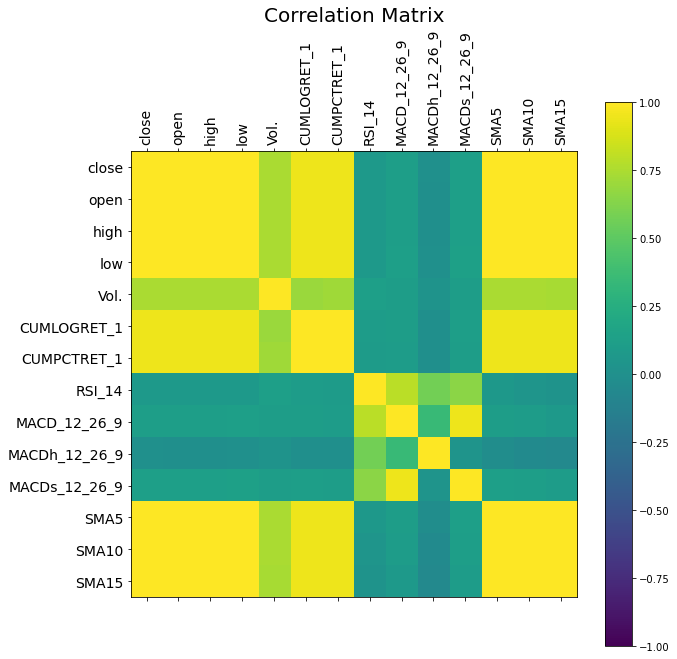

In [79]:
# Visualize the correlation matrix.
fig = plt.figure(figsize=(10,10)) 
ax = fig.add_subplot(111) # 1x1 grid, first subplot.
fig.colorbar(ax.matshow(bist_daily.corr(), vmin=-1, vmax=1)) 
ticks = np.arange(len(bist_daily.corr().columns))
ax.tick_params(axis='x', which='major', labelsize=14, rotation=90)
ax.tick_params(axis='y', which='major', labelsize=14, rotation=0)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(bist_daily.corr().columns)
ax.set_yticklabels(bist_daily.corr().columns)
plt.title("Correlation Matrix", fontsize=20)
plt.show()

{1: 2938, 2: 308, 3: 775, 4: 125, 5: 64, 6: 15, 7: 10, 10: 3, 11: 3, 12: 2, 28: 1, 29: 2, 31: 4, 60: 1}


<BarContainer object of 14 artists>

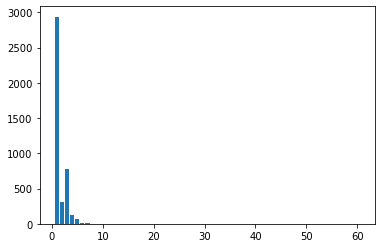

In [6]:
diff = [] 
for date1, date2 in zip(bist_daily["date"][:-1], bist_daily["date"][1:]): 
    diff.append((date2-date1).days) 
unique, counts = np.unique(np.asarray(diff), return_counts=True) 
count_dict = dict(zip(unique, counts)) 
print(count_dict) 
plt.bar(unique,counts)

In [7]:
# edit Vol. column

from operator import itemgetter

vols = bist_daily['Vol.'].to_list()
#[vol[-1] for vol in vols]
#list(filter(lambda vol: "-" in vol,enumerate(vols)))

indexToRemove = bist_daily.iloc[list(map(itemgetter(0),filter(lambda vol: "-" in vol,enumerate(vols))))].index
bist_daily.drop(indexToRemove,inplace=True)
bist_daily['Vol.'] = bist_daily['Vol.'].apply(
    lambda x: float(x[:-1])*(10**6) if x[-1]=="M" else (float(x[:-1])*(10**9) if x[-1]=="B" else "ERROR")).astype("int")
bist_daily

,date,close,open,high,low,Vol.,Change %,USDTRY_Close,CUMLOGRET_1,CUMPCTRET_1,RSI_14,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA5,SMA10,SMA15
date,,,,,,,,,,,,,,,,,
2000-02-29,2000-02-29,159.46,153.15,159.46,151.12,38200000,4.12%,"0,5743",-0.059997,-0.031662,50.482972,-7.536726,2.021502,-9.558229,149.956,150.081,152.436667
2000-03-02,2000-03-02,169.40,171.99,174.08,166.83,60080000,-1.51%,"0,5592",0.000472,0.030673,57.007643,-5.687707,3.096417,-8.784124,156.942,151.187,153.030000
2000-03-03,2000-03-03,167.84,169.40,170.67,163.96,53290000,-0.92%,"0,5771",-0.008779,0.021464,55.765721,-4.298673,3.588361,-7.887034,161.206,152.629,153.666000
2000-03-07,2000-03-07,172.23,165.63,172.23,163.13,33310000,3.98%,"0,6214",0.017040,0.047620,58.505269,-2.811211,4.060658,-6.871869,164.416,154.488,154.749333
2000-03-08,2000-03-08,173.44,172.23,175.01,169.28,44390000,0.70%,"0,6420",0.024041,0.054646,59.254312,-1.517260,4.283688,-5.800948,168.474,157.263,156.154000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,2019-08-01,1019.00,1013.42,1021.83,1010.93,1040000000,-0.18%,"5,4811",1.794787,2.848509,56.453510,-2.625148,0.532934,-3.158082,983.092,961.746,988.730667
2019-08-02,2019-08-02,996.79,1015.08,1017.07,996.30,970540000,-2.18%,"5,2474",1.772750,2.826713,51.628336,-1.558935,1.279317,-2.838253,1001.758,967.324,985.630000
2019-10-01,2019-10-01,1038.77,1052.75,1052.97,1031.89,1810000000,-1.10%,"5,4168",1.814002,2.868828,58.796876,2.643014,4.385014,-1.741999,1010.040,977.668,984.826667


In [8]:
# seeding an arbitrary number to get same results in multiple runs
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)
print("Seed:", manualSeed)

Seed: 999


In [9]:
# getting number of GPUs from cuda
ngpu = torch.cuda.device_count()
print("Count of available GPUs:", ngpu)

Count of available GPUs: 1


In [10]:
# printing the name of available GPUs
for i in range(ngpu):
    print("GPU {}: {}".format(i+1, torch.cuda.get_device_name(i)))

GPU 1: GeForce RTX 2060


In [53]:
# batch size for the training
batch_size = 64

# optimizer rates
optimizer_betas = (0.9, 0.999)
learning_rate = 5e-4

# number of epochs
num_epochs = 3000

# evaluate after evaluation_epoch_num epochs
evaluation_epoch_num = 20

# decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [12]:
class TimeseriesDataset(Dataset):
    def __init__(self, data_frame, sequence_length=2):
        self.data = torch.tensor(data_frame.values)
        self.sequence_length = sequence_length

    def __len__(self):
        return self.data.shape[0] - self.sequence_length + 1

    def __getitem__(self, index):
        return self.data[index: index + self.sequence_length].float()
    
    # Non-overlapping series
    # def __getitem__(self, index):
    #     return self.data[index * self.sequence_length: (index+1) * self.sequence_length]

In [13]:
# create pytorch dataset from the pandas DataFrame

# TODO: Convert change(%) and Volume columns to numeric values
columns_used_in_training = ["close", "open", "high", "low", "CUMLOGRET_1", "RSI_14", "MACD_12_26_9", "SMA5"]
# input dimension of the generator
data_dimension = len(columns_used_in_training)
# sequence length of input data
sequence_length = 7

train_data, rest_data = train_test_split(bist_daily[columns_used_in_training], test_size=0.2, shuffle=False)

scaler = MinMaxScaler()
scaler.fit(train_data)
train_data[train_data.columns] = scaler.transform(train_data)
rest_data[rest_data.columns] = scaler.transform(rest_data)

validation_data, test_data = train_test_split(rest_data, test_size=0.5, shuffle=False)

train_dataset = TimeseriesDataset(train_data, sequence_length)
test_dataset = TimeseriesDataset(test_data, sequence_length)
validation_dataset = TimeseriesDataset(validation_data, sequence_length)

# create the dataloader
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size)
real_data_sample = next(iter(train_dataloader))
print("Real data sample shape:", real_data_sample.shape)

Real data sample shape: torch.Size([64, 7, 8])


In [14]:
class Generator(nn.Module):
    def __init__(self, hidden_size):
        super(Generator, self).__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(input_size=data_dimension, hidden_size=hidden_size, num_layers=1, dropout=0.2, batch_first=True)
        self.linear = nn.Linear(hidden_size, data_dimension)
        self.drop = nn.Dropout(0.2)

    def forward(self, input_sequences):
        input_sequences = self.drop(input_sequences)
        lstm_output, hidden_cell = self.lstm(input_sequences)
        res = self.linear(hidden_cell[0][-1])
        res = res.view(res.shape[0], 1, -1)
        return res

In [15]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(sequence_length*data_dimension, 16),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),
            nn.Linear(16, 8),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),
            nn.Linear(8, 1),
            nn.Sigmoid(),
        )

    def forward(self, input_sequences):
        input_sequences_flattened = input_sequences.view(input_sequences.shape[0], -1)
        res = self.model(input_sequences_flattened)
        return res

In [16]:
def model_rmse(model, dataloader, epoch, plot_graph=False, plot_title="Validation Predictions"):
    rmse = 0
    squared_error_list = []
    real_data_list = []
    predicted_data_list = []
    for i, sequence_batch in enumerate(dataloader):
        with torch.no_grad():
            real_sequence = sequence_batch
            # Assign first t values
            generator_input_sequence = sequence_batch[:,:-1].to(device)
            real_values = sequence_batch[:,-1:]
            #  Generate (t+1)th value from first t values
            predicted_values = generator(generator_input_sequence).cpu()
            real_data_list.append(real_values)
            predicted_data_list.append(predicted_values)
    
    real_data = torch.cat(real_data_list, 0)
    predicted_data = torch.cat(predicted_data_list, 0)
    
    # Unscale data
    df_pred = pd.DataFrame(predicted_data.view(-1,len(columns_used_in_training)),columns=columns_used_in_training)
    df_pred_unscaled = pd.DataFrame(scaler.inverse_transform(df_pred),columns=columns_used_in_training)
    df_real = pd.DataFrame(real_data.view(-1,len(columns_used_in_training)),columns=columns_used_in_training)
    df_real_unscaled = pd.DataFrame(scaler.inverse_transform(df_real),columns=columns_used_in_training)
    
    if plot_graph:
        if not os.path.exists('./plots/'):
            os.makedirs('./plots/')
        
        for column in columns_used_in_training:
            # TODO: get x values and plot prediction of multiple columns
            fig = plt.figure(figsize=(16,8))
            plt.xlabel("Date")
            plt.ylabel(column)
            plt.title(plot_title + f" -{column}-")
            plt.plot(df_real_unscaled[column],label="Real")
            plt.plot(df_pred_unscaled[column],label="Predicted")
            # plt.ylim(bottom=0)
            plt.legend()
            fig.savefig(f'./plots/plt_{column}_epoch_{epoch}.png')
            plt.close(fig)
    rmse_results = {}
    for column in columns_used_in_training:
        squared_errors = (df_real_unscaled[column] - df_pred_unscaled[column])**2
        rmse = np.sqrt(squared_errors.mean())
        rmse_results[column] = rmse
    return rmse_results

In [17]:
# TODO: weight initialization of models

In [18]:
generator = Generator(hidden_size=data_dimension*2).to(device)
discriminator = Discriminator().to(device)
print("Generator and discriminator are initialized")

C:\Users\yildi\anaconda3\lib\site-packages\torch\nn\modules\rnn.py:58: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Generator and discriminator are initialized


In [19]:
criterion = nn.BCELoss()
optimizer_generator = optim.Adam(generator.parameters(), lr=learning_rate, betas=optimizer_betas)
optimizer_discriminator = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=optimizer_betas)

real_label = 1.
fake_label = 0.

In [20]:
if not os.path.exists('./models/'):
    os.makedirs('./models/')

In [21]:
evaluation_metrics = {"gen_loss":[], "disc_loss":[], "rmse_values":{}}
for column in columns_used_in_training:
        evaluation_metrics["rmse_values"][column] = []
                      
print("Training is started")
for epoch in range(num_epochs):
    for i, sequence_batch in enumerate(train_dataloader):
            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Training with real batch
            discriminator.zero_grad()
            # Format batch
            real_sequence = sequence_batch.to(device)
            batch_size = real_sequence.size(0)
            real_labels = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            discriminator_output_real = discriminator(real_sequence).view(-1)
            # Calculate loss on all-real batch
            discriminator_error_real = criterion(discriminator_output_real, real_labels)
            # Calculate gradients for D in backward pass
            discriminator_error_real.backward()

            ## Training with fake batch
            # Assign first t values
            generator_input_sequence = sequence_batch[:,:-1].to(device)
            #  Generate (t+1)th value from first t values
            generated_values = generator(generator_input_sequence)
            fake_labels = torch.full((batch_size,), fake_label, dtype=torch.float, device=device)
            # Concat first t real values and generated (t+1)th values
            generator_result_concat = torch.cat((generator_input_sequence, generated_values.detach()), 1)
            # Classify all fake batch with D
            discriminator_output_fake = discriminator(generator_result_concat).view(-1)
            # Calculate D's loss on the all-fake batch
            discriminator_error_fake = criterion(discriminator_output_fake, fake_labels)
            # Calculate the gradients for this batch
            discriminator_error_fake.backward()
            # Add the gradients from the all-real and all-fake batches
            discriminator_error = discriminator_error_real + discriminator_error_fake
            # Update D
            optimizer_discriminator.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            generator.zero_grad()
            real_labels = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            # Since we just updated D, perform another forward pass of all-fake batch through D
            generator_result_concat_grad = torch.cat((generator_input_sequence, generated_values), 1)
            discriminator_output_fake = discriminator(generator_result_concat_grad).view(-1)
            # Calculate G's loss based on this output
            generator_error = criterion(discriminator_output_fake, real_labels)
            # Calculate gradients for G
            generator_error.backward()
            # Update G
            optimizer_generator.step()
    if (epoch+1) % 5 == 0 or epoch+1 == 1:
        rmse_values = model_rmse(generator, validation_dataloader, epoch=(epoch+1), plot_graph=True)
        for column in columns_used_in_training:
            evaluation_metrics["rmse_values"][column].append(rmse_values[column])
        evaluation_metrics["gen_loss"].append(generator_error.item())
        evaluation_metrics["disc_loss"].append(discriminator_error.item())
        print('\n[{}/{}]\tDiscriminator Loss: {:.4f}\tGenerator Loss: {:.4f}'
                  .format(epoch+1, num_epochs, discriminator_error.item(), generator_error.item()))
        for col_name, rmse in rmse_values.items():
            print(f"{col_name} RMSE: {rmse:.4f}")
        save_path = os.path.join("./models/","model_epoch_{}.pt".format(epoch+1))
        torch.save({
            'epoch': epoch+1,
            'generator_model_state_dict': generator.state_dict(),
            'discriminator_model_state_dict': discriminator.state_dict(),
            'optimizer_generator_state_dict': optimizer_generator.state_dict(),
            'optimizer_discriminator_state_dict': optimizer_discriminator.state_dict(),
            'discriminator_loss': discriminator_error,
            'generator_loss': generator_error,
            }, save_path)

Training is started

[1/3000]	Discriminator Loss: 1.3547	Generator Loss: 0.7298
close RMSE: 634.5654
open RMSE: 374.1994
high RMSE: 508.2569
low RMSE: 558.6644
CUMLOGRET_1 RMSE: 1.4020
RSI_14 RMSE: 30.5056
MACD_12_26_9 RMSE: 12.2822
SMA5 RMSE: 431.0996

[5/3000]	Discriminator Loss: 1.3839	Generator Loss: 0.7435
close RMSE: 699.2350
open RMSE: 675.4416
high RMSE: 795.2961
low RMSE: 526.0866
CUMLOGRET_1 RMSE: 2.4735
RSI_14 RMSE: 44.6839
MACD_12_26_9 RMSE: 31.8117
SMA5 RMSE: 673.9825

[10/3000]	Discriminator Loss: 1.3419	Generator Loss: 0.7361
close RMSE: 627.5548
open RMSE: 240.3669
high RMSE: 491.4150
low RMSE: 621.1602
CUMLOGRET_1 RMSE: 0.1624
RSI_14 RMSE: 11.6052
MACD_12_26_9 RMSE: 21.3613
SMA5 RMSE: 786.8849

[15/3000]	Discriminator Loss: 1.3481	Generator Loss: 0.7257
close RMSE: 79.6616
open RMSE: 651.2972
high RMSE: 160.0449
low RMSE: 377.5362
CUMLOGRET_1 RMSE: 0.5397
RSI_14 RMSE: 12.5905
MACD_12_26_9 RMSE: 22.5907
SMA5 RMSE: 393.8435

[20/3000]	Discriminator Loss: 1.3458	Generator


[180/3000]	Discriminator Loss: 1.0470	Generator Loss: 1.3935
close RMSE: 58.4276
open RMSE: 45.2809
high RMSE: 45.2926
low RMSE: 64.2025
CUMLOGRET_1 RMSE: 0.1198
RSI_14 RMSE: 8.4592
MACD_12_26_9 RMSE: 5.9773
SMA5 RMSE: 54.1757

[185/3000]	Discriminator Loss: 0.9400	Generator Loss: 1.7173
close RMSE: 49.8947
open RMSE: 41.1528
high RMSE: 43.0911
low RMSE: 48.8530
CUMLOGRET_1 RMSE: 0.1142
RSI_14 RMSE: 8.4644
MACD_12_26_9 RMSE: 5.2263
SMA5 RMSE: 53.5083

[190/3000]	Discriminator Loss: 0.9751	Generator Loss: 1.6846
close RMSE: 49.2203
open RMSE: 51.8890
high RMSE: 46.8963
low RMSE: 58.0117
CUMLOGRET_1 RMSE: 0.1248
RSI_14 RMSE: 8.4360
MACD_12_26_9 RMSE: 5.8928
SMA5 RMSE: 57.0746

[195/3000]	Discriminator Loss: 1.0848	Generator Loss: 1.1611
close RMSE: 56.3043
open RMSE: 48.5989
high RMSE: 46.9482
low RMSE: 59.9846
CUMLOGRET_1 RMSE: 0.1214
RSI_14 RMSE: 8.7669
MACD_12_26_9 RMSE: 5.1415
SMA5 RMSE: 57.1964

[200/3000]	Discriminator Loss: 1.0050	Generator Loss: 1.8237
close RMSE: 47.0527
open R


[360/3000]	Discriminator Loss: 1.0799	Generator Loss: 1.5887
close RMSE: 32.5935
open RMSE: 25.0987
high RMSE: 23.3790
low RMSE: 29.2850
CUMLOGRET_1 RMSE: 0.0908
RSI_14 RMSE: 9.3900
MACD_12_26_9 RMSE: 3.6823
SMA5 RMSE: 23.7971

[365/3000]	Discriminator Loss: 1.0496	Generator Loss: 1.7269
close RMSE: 31.5580
open RMSE: 29.6856
high RMSE: 25.8716
low RMSE: 42.0092
CUMLOGRET_1 RMSE: 0.0876
RSI_14 RMSE: 10.1182
MACD_12_26_9 RMSE: 3.9825
SMA5 RMSE: 25.6427

[370/3000]	Discriminator Loss: 0.9969	Generator Loss: 2.0184
close RMSE: 40.3079
open RMSE: 32.5926
high RMSE: 23.0481
low RMSE: 37.8426
CUMLOGRET_1 RMSE: 0.0901
RSI_14 RMSE: 10.6879
MACD_12_26_9 RMSE: 3.6190
SMA5 RMSE: 23.9442

[375/3000]	Discriminator Loss: 1.0815	Generator Loss: 1.6104
close RMSE: 33.4264
open RMSE: 24.8046
high RMSE: 24.0297
low RMSE: 35.9029
CUMLOGRET_1 RMSE: 0.0846
RSI_14 RMSE: 9.7273
MACD_12_26_9 RMSE: 3.6747
SMA5 RMSE: 24.1664

[380/3000]	Discriminator Loss: 1.0398	Generator Loss: 2.5994
close RMSE: 29.9586
open


[540/3000]	Discriminator Loss: 0.8305	Generator Loss: 2.2060
close RMSE: 23.3943
open RMSE: 40.5224
high RMSE: 27.8802
low RMSE: 51.2886
CUMLOGRET_1 RMSE: 0.0880
RSI_14 RMSE: 10.1481
MACD_12_26_9 RMSE: 3.2753
SMA5 RMSE: 22.6168

[545/3000]	Discriminator Loss: 1.0325	Generator Loss: 2.1319
close RMSE: 27.8198
open RMSE: 24.5813
high RMSE: 21.1626
low RMSE: 29.5446
CUMLOGRET_1 RMSE: 0.0962
RSI_14 RMSE: 10.9634
MACD_12_26_9 RMSE: 3.5910
SMA5 RMSE: 26.7684

[550/3000]	Discriminator Loss: 1.1663	Generator Loss: 1.4924
close RMSE: 24.9364
open RMSE: 33.4437
high RMSE: 21.1119
low RMSE: 32.7477
CUMLOGRET_1 RMSE: 0.0908
RSI_14 RMSE: 10.5147
MACD_12_26_9 RMSE: 3.5606
SMA5 RMSE: 23.5886

[555/3000]	Discriminator Loss: 1.0381	Generator Loss: 1.7569
close RMSE: 24.6120
open RMSE: 25.9879
high RMSE: 21.3585
low RMSE: 24.4514
CUMLOGRET_1 RMSE: 0.0930
RSI_14 RMSE: 10.9015
MACD_12_26_9 RMSE: 3.4202
SMA5 RMSE: 24.7791

[560/3000]	Discriminator Loss: 1.0455	Generator Loss: 2.1230
close RMSE: 26.0375
op


[720/3000]	Discriminator Loss: 1.3737	Generator Loss: 0.7905
close RMSE: 26.1879
open RMSE: 22.6911
high RMSE: 27.2708
low RMSE: 24.2372
CUMLOGRET_1 RMSE: 0.0854
RSI_14 RMSE: 11.0304
MACD_12_26_9 RMSE: 3.0162
SMA5 RMSE: 21.0882

[725/3000]	Discriminator Loss: 1.1589	Generator Loss: 1.7808
close RMSE: 21.9685
open RMSE: 25.9057
high RMSE: 26.5679
low RMSE: 23.2715
CUMLOGRET_1 RMSE: 0.0929
RSI_14 RMSE: 11.6845
MACD_12_26_9 RMSE: 3.8916
SMA5 RMSE: 21.5988

[730/3000]	Discriminator Loss: 1.3746	Generator Loss: 1.0898
close RMSE: 21.3317
open RMSE: 22.8067
high RMSE: 25.4512
low RMSE: 20.8306
CUMLOGRET_1 RMSE: 0.0837
RSI_14 RMSE: 10.4205
MACD_12_26_9 RMSE: 3.1610
SMA5 RMSE: 22.4798

[735/3000]	Discriminator Loss: 0.9851	Generator Loss: 1.3767
close RMSE: 23.8456
open RMSE: 31.9693
high RMSE: 25.8225
low RMSE: 20.4233
CUMLOGRET_1 RMSE: 0.1091
RSI_14 RMSE: 10.0361
MACD_12_26_9 RMSE: 3.1657
SMA5 RMSE: 22.8829

[740/3000]	Discriminator Loss: 1.0568	Generator Loss: 1.3482
close RMSE: 23.5395
op


[900/3000]	Discriminator Loss: 1.4222	Generator Loss: 0.7885
close RMSE: 20.7967
open RMSE: 20.3420
high RMSE: 24.6771
low RMSE: 22.9302
CUMLOGRET_1 RMSE: 0.0980
RSI_14 RMSE: 9.6547
MACD_12_26_9 RMSE: 3.0429
SMA5 RMSE: 18.3075

[905/3000]	Discriminator Loss: 1.2674	Generator Loss: 0.9182
close RMSE: 19.0477
open RMSE: 23.7431
high RMSE: 22.8290
low RMSE: 20.2515
CUMLOGRET_1 RMSE: 0.0868
RSI_14 RMSE: 9.3879
MACD_12_26_9 RMSE: 2.5162
SMA5 RMSE: 22.1490

[910/3000]	Discriminator Loss: 1.0728	Generator Loss: 2.5675
close RMSE: 20.7552
open RMSE: 19.8057
high RMSE: 24.0345
low RMSE: 36.0036
CUMLOGRET_1 RMSE: 0.0785
RSI_14 RMSE: 10.0880
MACD_12_26_9 RMSE: 3.9098
SMA5 RMSE: 18.3648

[915/3000]	Discriminator Loss: 1.1484	Generator Loss: 2.0437
close RMSE: 19.2699
open RMSE: 21.8341
high RMSE: 21.8594
low RMSE: 23.0822
CUMLOGRET_1 RMSE: 0.0807
RSI_14 RMSE: 8.7565
MACD_12_26_9 RMSE: 2.3032
SMA5 RMSE: 20.0851

[920/3000]	Discriminator Loss: 1.0982	Generator Loss: 1.6332
close RMSE: 20.9058
open 


[1080/3000]	Discriminator Loss: 1.2171	Generator Loss: 0.8966
close RMSE: 20.3693
open RMSE: 25.2101
high RMSE: 26.9061
low RMSE: 18.7393
CUMLOGRET_1 RMSE: 0.0826
RSI_14 RMSE: 9.2830
MACD_12_26_9 RMSE: 2.5856
SMA5 RMSE: 19.0118

[1085/3000]	Discriminator Loss: 1.2283	Generator Loss: 1.2178
close RMSE: 18.6461
open RMSE: 19.6755
high RMSE: 22.0204
low RMSE: 19.1660
CUMLOGRET_1 RMSE: 0.0803
RSI_14 RMSE: 8.5128
MACD_12_26_9 RMSE: 2.1474
SMA5 RMSE: 19.0412

[1090/3000]	Discriminator Loss: 1.0181	Generator Loss: 1.6341
close RMSE: 23.1165
open RMSE: 26.3151
high RMSE: 23.0341
low RMSE: 31.2874
CUMLOGRET_1 RMSE: 0.0912
RSI_14 RMSE: 8.5301
MACD_12_26_9 RMSE: 2.2798
SMA5 RMSE: 20.5116

[1095/3000]	Discriminator Loss: 1.0188	Generator Loss: 1.8951
close RMSE: 21.9414
open RMSE: 21.1732
high RMSE: 26.9375
low RMSE: 30.6718
CUMLOGRET_1 RMSE: 0.0806
RSI_14 RMSE: 8.4212
MACD_12_26_9 RMSE: 3.1058
SMA5 RMSE: 22.0695

[1100/3000]	Discriminator Loss: 1.1929	Generator Loss: 0.9258
close RMSE: 21.9329
o


[1260/3000]	Discriminator Loss: 1.2117	Generator Loss: 0.9711
close RMSE: 20.8383
open RMSE: 20.6117
high RMSE: 24.7524
low RMSE: 27.9744
CUMLOGRET_1 RMSE: 0.1028
RSI_14 RMSE: 8.8332
MACD_12_26_9 RMSE: 2.0473
SMA5 RMSE: 17.3716

[1265/3000]	Discriminator Loss: 1.5482	Generator Loss: 0.4256
close RMSE: 20.2620
open RMSE: 22.4615
high RMSE: 22.5539
low RMSE: 22.3064
CUMLOGRET_1 RMSE: 0.0880
RSI_14 RMSE: 8.8365
MACD_12_26_9 RMSE: 2.2268
SMA5 RMSE: 16.2660

[1270/3000]	Discriminator Loss: 1.3399	Generator Loss: 0.7255
close RMSE: 19.8650
open RMSE: 21.1154
high RMSE: 22.1970
low RMSE: 22.6790
CUMLOGRET_1 RMSE: 0.0932
RSI_14 RMSE: 9.0762
MACD_12_26_9 RMSE: 2.0452
SMA5 RMSE: 22.4718

[1275/3000]	Discriminator Loss: 1.2203	Generator Loss: 1.8748
close RMSE: 22.0159
open RMSE: 22.4226
high RMSE: 27.2432
low RMSE: 19.5819
CUMLOGRET_1 RMSE: 0.0919
RSI_14 RMSE: 9.3895
MACD_12_26_9 RMSE: 2.3797
SMA5 RMSE: 15.7903

[1280/3000]	Discriminator Loss: 1.3474	Generator Loss: 0.8768
close RMSE: 23.9171
o


[1440/3000]	Discriminator Loss: 1.3017	Generator Loss: 0.7464
close RMSE: 19.6167
open RMSE: 18.7946
high RMSE: 22.2226
low RMSE: 20.1111
CUMLOGRET_1 RMSE: 0.0858
RSI_14 RMSE: 8.8683
MACD_12_26_9 RMSE: 2.3124
SMA5 RMSE: 14.7453

[1445/3000]	Discriminator Loss: 1.1813	Generator Loss: 0.9324
close RMSE: 19.4706
open RMSE: 19.8569
high RMSE: 23.6011
low RMSE: 20.7741
CUMLOGRET_1 RMSE: 0.1057
RSI_14 RMSE: 8.8178
MACD_12_26_9 RMSE: 1.9755
SMA5 RMSE: 19.9691

[1450/3000]	Discriminator Loss: 1.1114	Generator Loss: 1.9043
close RMSE: 18.7519
open RMSE: 20.1843
high RMSE: 23.1753
low RMSE: 21.7114
CUMLOGRET_1 RMSE: 0.0819
RSI_14 RMSE: 8.1508
MACD_12_26_9 RMSE: 1.9902
SMA5 RMSE: 14.8954

[1455/3000]	Discriminator Loss: 1.2288	Generator Loss: 1.0635
close RMSE: 22.7937
open RMSE: 20.2355
high RMSE: 23.8577
low RMSE: 30.2272
CUMLOGRET_1 RMSE: 0.0790
RSI_14 RMSE: 8.6720
MACD_12_26_9 RMSE: 2.2263
SMA5 RMSE: 13.4882

[1460/3000]	Discriminator Loss: 1.0988	Generator Loss: 0.9911
close RMSE: 19.7325
o


[1620/3000]	Discriminator Loss: 1.1030	Generator Loss: 2.0377
close RMSE: 17.9417
open RMSE: 19.9349
high RMSE: 22.1140
low RMSE: 23.3217
CUMLOGRET_1 RMSE: 0.0877
RSI_14 RMSE: 8.6308
MACD_12_26_9 RMSE: 3.5425
SMA5 RMSE: 15.7087

[1625/3000]	Discriminator Loss: 1.3797	Generator Loss: 2.1464
close RMSE: 17.6750
open RMSE: 19.0552
high RMSE: 22.5815
low RMSE: 18.0098
CUMLOGRET_1 RMSE: 0.0845
RSI_14 RMSE: 8.1277
MACD_12_26_9 RMSE: 2.6642
SMA5 RMSE: 14.9884

[1630/3000]	Discriminator Loss: 1.3425	Generator Loss: 0.6384
close RMSE: 20.8784
open RMSE: 22.4704
high RMSE: 26.0469
low RMSE: 24.1864
CUMLOGRET_1 RMSE: 0.0835
RSI_14 RMSE: 8.4209
MACD_12_26_9 RMSE: 1.9915
SMA5 RMSE: 20.8268

[1635/3000]	Discriminator Loss: 0.9461	Generator Loss: 3.5367
close RMSE: 17.9207
open RMSE: 23.4172
high RMSE: 23.7970
low RMSE: 19.3517
CUMLOGRET_1 RMSE: 0.0821
RSI_14 RMSE: 8.2141
MACD_12_26_9 RMSE: 2.1649
SMA5 RMSE: 19.9869

[1640/3000]	Discriminator Loss: 0.9373	Generator Loss: 3.1739
close RMSE: 21.0968
o


[1800/3000]	Discriminator Loss: 1.2970	Generator Loss: 1.2801
close RMSE: 26.4453
open RMSE: 17.9095
high RMSE: 22.9110
low RMSE: 18.3128
CUMLOGRET_1 RMSE: 0.0774
RSI_14 RMSE: 8.1590
MACD_12_26_9 RMSE: 2.3808
SMA5 RMSE: 14.7548

[1805/3000]	Discriminator Loss: 1.3727	Generator Loss: 0.6623
close RMSE: 27.4814
open RMSE: 20.8669
high RMSE: 21.1900
low RMSE: 21.5025
CUMLOGRET_1 RMSE: 0.0908
RSI_14 RMSE: 9.2650
MACD_12_26_9 RMSE: 1.9998
SMA5 RMSE: 19.1203

[1810/3000]	Discriminator Loss: 1.3262	Generator Loss: 0.9396
close RMSE: 20.0589
open RMSE: 17.7823
high RMSE: 21.9882
low RMSE: 19.4581
CUMLOGRET_1 RMSE: 0.0843
RSI_14 RMSE: 8.5454
MACD_12_26_9 RMSE: 1.9721
SMA5 RMSE: 13.0267

[1815/3000]	Discriminator Loss: 1.3944	Generator Loss: 0.5605
close RMSE: 18.4907
open RMSE: 18.6013
high RMSE: 22.6879
low RMSE: 19.4702
CUMLOGRET_1 RMSE: 0.0923
RSI_14 RMSE: 8.9372
MACD_12_26_9 RMSE: 1.7529
SMA5 RMSE: 13.4031

[1820/3000]	Discriminator Loss: 1.2019	Generator Loss: 0.8707
close RMSE: 17.8888
o


[1980/3000]	Discriminator Loss: 1.2225	Generator Loss: 0.9565
close RMSE: 26.1505
open RMSE: 17.2424
high RMSE: 22.1058
low RMSE: 18.6690
CUMLOGRET_1 RMSE: 0.0901
RSI_14 RMSE: 8.5272
MACD_12_26_9 RMSE: 2.1100
SMA5 RMSE: 16.8836

[1985/3000]	Discriminator Loss: 1.3386	Generator Loss: 0.6213
close RMSE: 18.9768
open RMSE: 16.6962
high RMSE: 19.3931
low RMSE: 17.7339
CUMLOGRET_1 RMSE: 0.0893
RSI_14 RMSE: 7.5555
MACD_12_26_9 RMSE: 2.0118
SMA5 RMSE: 13.0725

[1990/3000]	Discriminator Loss: 1.4493	Generator Loss: 1.3373
close RMSE: 16.4938
open RMSE: 19.4572
high RMSE: 24.1797
low RMSE: 26.6723
CUMLOGRET_1 RMSE: 0.0836
RSI_14 RMSE: 7.7677
MACD_12_26_9 RMSE: 2.5600
SMA5 RMSE: 17.6365

[1995/3000]	Discriminator Loss: 1.3900	Generator Loss: 0.6014
close RMSE: 17.9271
open RMSE: 16.6869
high RMSE: 20.3194
low RMSE: 16.7215
CUMLOGRET_1 RMSE: 0.0753
RSI_14 RMSE: 7.4854
MACD_12_26_9 RMSE: 1.9336
SMA5 RMSE: 13.3185

[2000/3000]	Discriminator Loss: 1.3103	Generator Loss: 0.8001
close RMSE: 20.4056
o

KeyboardInterrupt: 

In [25]:

for key, val in evaluation_metrics["rmse_values"].items():
    print(key, ":", val)

close : [634.5654118214815, 699.2350233383758, 627.5548384163314, 79.66163497344516, 371.0035364012599, 177.10295577022424, 356.9186751513957, 506.072714096511, 241.13162247870764, 116.28432522406112, 75.3012053033199, 96.49029973836667, 132.1065992017951, 86.09241671052155, 110.6018728442001, 66.92279533601793, 73.24902597455149, 63.38436768738082, 122.94893925170813, 61.231521596616474, 57.24611407928386, 53.51494972258544, 56.69745367967884, 64.74783845404657, 58.265762270349306, 68.46360694653912, 61.13126224587899, 58.39219785190364, 70.67446801125428, 58.697870816408276, 59.58429773075125, 59.86501149162308, 57.2035412060334, 58.469940137528994, 56.66271822019384, 55.05500153237766, 58.42757373391851, 49.89470910682241, 49.22031926839397, 56.304335467173225, 47.05273491262492, 44.322779266406286, 50.68191179654442, 46.04819928307995, 43.48035977281839, 43.130769461651475, 45.61219468253077, 51.908264104639294, 39.96990548319997, 45.90204285206031, 41.80286276807532, 40.2669218503

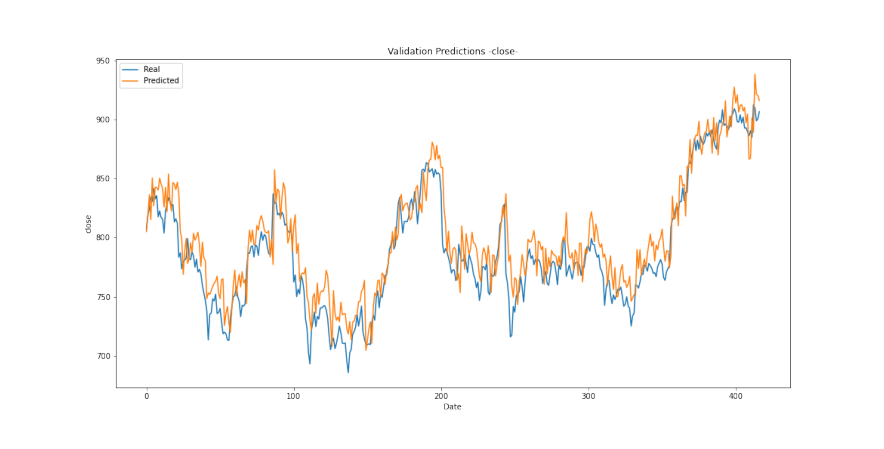

In [54]:
images = []
num_epochs = 2000
for epoch in range(num_epochs):
    if (epoch+1)%evaluation_epoch_num == 0 or epoch == 0 or epoch == (num_epochs-1):
        image_path = os.path.join('./plots/', f'plt_close_epoch_{epoch+1}.png')
        image = plt.imread(image_path)
        images.append(image)
#%%capture
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(16,8))
plt.axis("off")

all_images = [[plt.imshow(image, animated=True)] for image in images]
plt.rcParams['animation.embed_limit'] = 2**32
ani = animation.ArtistAnimation(fig, all_images, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

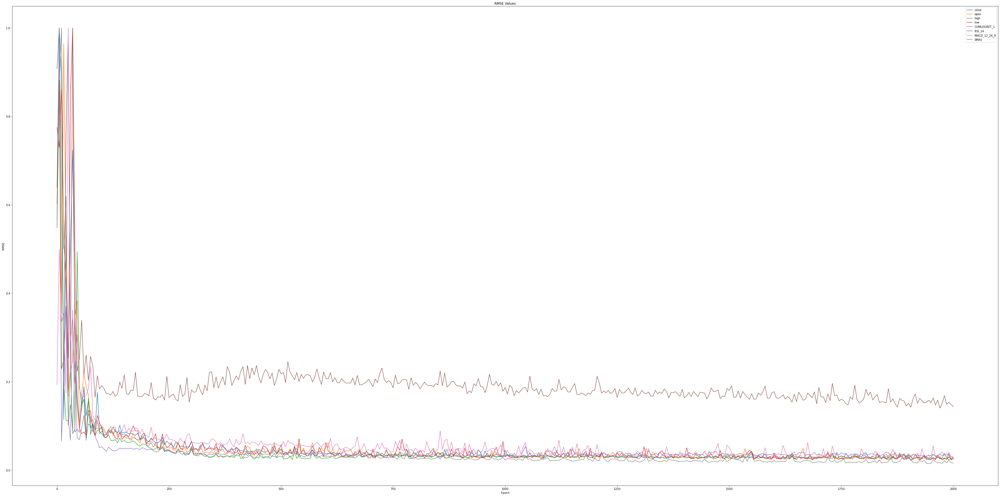

In [52]:
fig = plt.figure(figsize=(64,32))
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("RMSE Values")
epoch_len = len(evaluation_metrics["rmse_values"][columns_used_in_training[0]])
x = [0] + [i for i in range(5, 5*epoch_len, 5)]
# plt.ylim(0, 5)
for column in columns_used_in_training:
    y = evaluation_metrics["rmse_values"][column]
    y /= max(y)
    plt.plot(x, y,label=column)
plt.legend()
fig.savefig(f'./plots/rmse_all.png')
plt.show()
plt.close(fig)

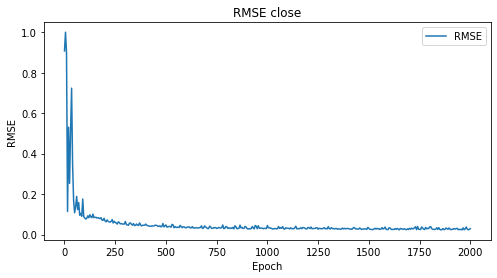

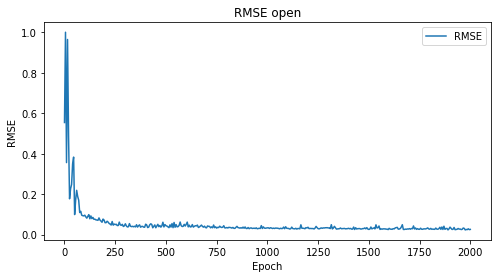

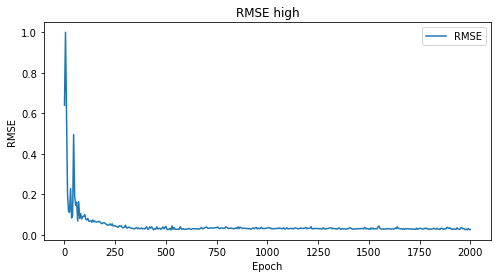

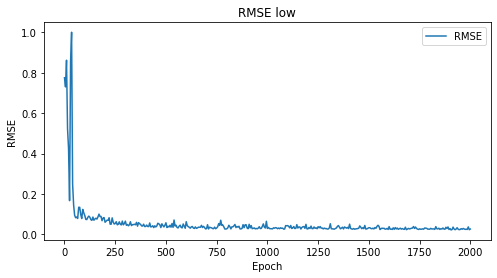

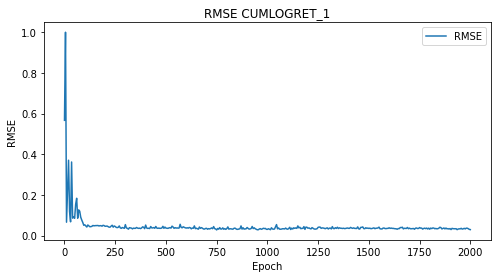

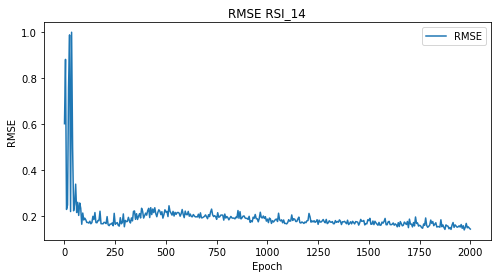

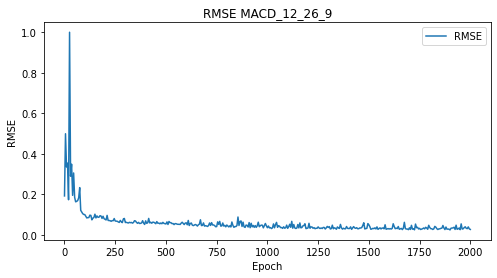

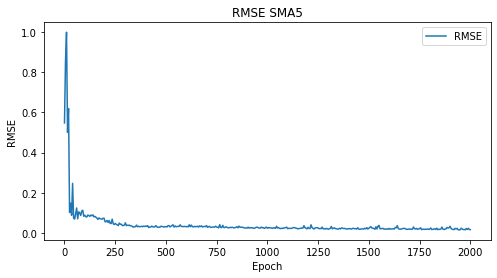

In [49]:
for column in columns_used_in_training:
    fig = plt.figure(figsize=(8,4))
    plt.xlabel("Epoch")
    plt.ylabel("RMSE")
    plt.title(f"RMSE {column}")
    epoch_len = len(evaluation_metrics["rmse_values"][columns_used_in_training[0]])
    x = [0] + [i for i in range(5, 5*epoch_len, 5)]
    # plt.ylim(0, 5)
    y = evaluation_metrics["rmse_values"][column]
    y /= max(y)
    plt.plot(x, y,label="RMSE")
    plt.legend()
    fig.savefig(f'./plots/rmse_{column}.png')
    plt.show()
    plt.close(fig)

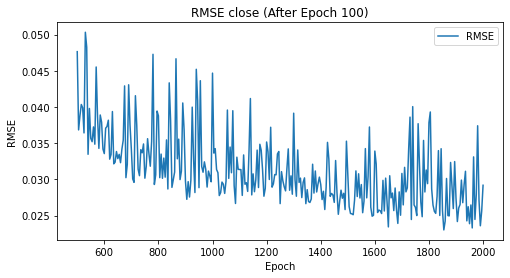

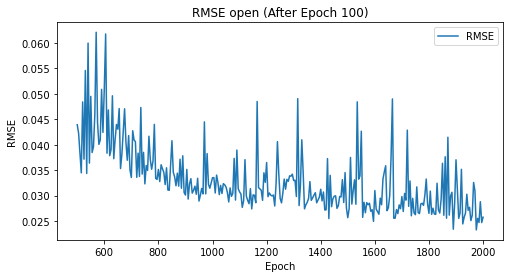

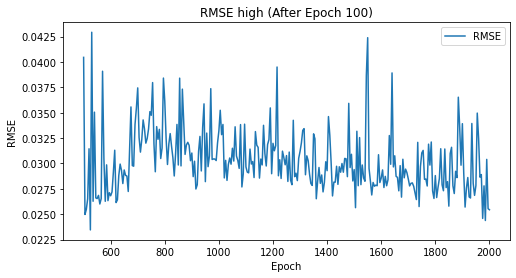

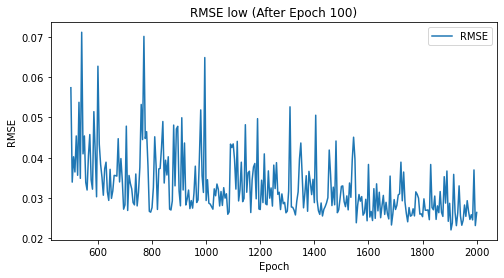

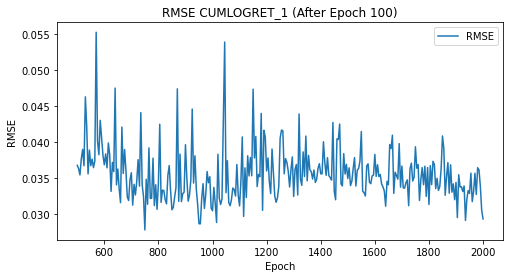

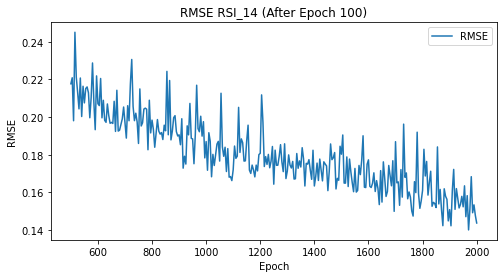

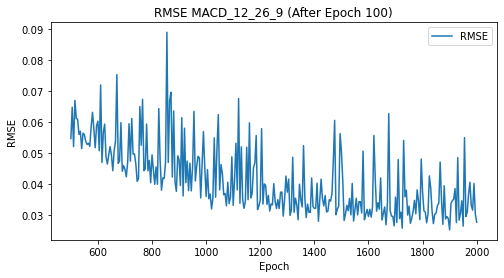

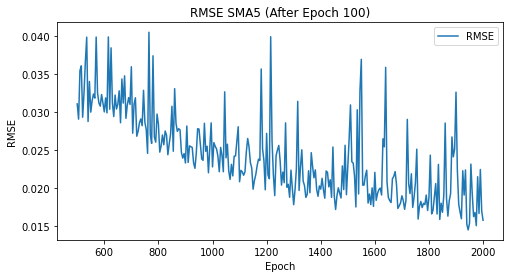

In [50]:
for column in columns_used_in_training:
    fig = plt.figure(figsize=(8,4))
    plt.xlabel("Epoch")
    plt.ylabel("RMSE")
    plt.title(f"RMSE {column} (After Epoch 100)")
    epoch_len = len(evaluation_metrics["rmse_values"][columns_used_in_training[0]])
    x = [0] + [i for i in range(5, 5*epoch_len, 5)]
    # plt.ylim(0, 5)
    y = evaluation_metrics["rmse_values"][column]
    y /= max(y)
    plt.plot(x[100:], y[100:],label="RMSE")
    plt.legend()
    fig.savefig(f'./plots/rmse_{column}.png')
    plt.show()
    plt.close(fig)